In [1]:
%matplotlib inline

import warnings; warnings.simplefilter('ignore')

In [71]:
import pandas as pd
import os
from functools import reduce
import matplotlib.pyplot as plt
inline_rc = dict(plt.rcParams)
import numpy as np

from scipy.stats.stats import pearsonr
from scipy import stats
from scipy.stats import ks_2samp
from scipy.stats import entropy
from scipy.stats import norm
from scipy.stats import lognorm
from scipy.stats import nbinom
from scipy.stats.mstats import gmean
from scipy.cluster import hierarchy
from scipy.cluster.hierarchy import average
from scipy.cluster.hierarchy import dendrogram


import statsmodels.api as sm
lowess = sm.nonparametric.lowess
import math

import scipy.spatial.distance
from scipy.spatial.distance import *

import scipy.cluster

import sklearn
import sklearn.preprocessing

from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from matplotlib.colors import LinearSegmentedColormap

from sklearn import metrics
from sklearn.tree import DecisionTreeClassifier


import seaborn as sns

from PIL import Image

/anaconda3/lib/python3.6/site-packages/matplotlib/__init__.py:886: MatplotlibDeprecationWarning: 
examples.directory is deprecated; in the future, examples will be found relative to the 'datapath' directory.
  "found relative to the 'datapath' directory.".format(key))


In [3]:
from scipy import ndimage
from scipy import misc

In [4]:
#
# load selected data from Eisen 1998
# 

e98 = pd.read_csv("data/clustering/eisen_1998.txt", sep="\t")

#
# get a list of data columns
#

e98_datacols = e98.columns.values[2:]

# 
# get data matrix
#

e98_data = e98[e98_datacols].fillna(0).values

#
# make copy of data where all genes have unit norm for some applications
#

e98_datan = sklearn.preprocessing.normalize(e98_data)

#
# get a list of genes
#

e98_genes = e98['ORF']



In [7]:
e98.iloc[rows,:][e98_datacols]

,alpha 0,alpha 7,alpha 14,alpha 21,alpha 28,alpha 35,alpha 42,alpha 49,alpha 56,alpha 63,...,cold 20,cold 40,cold 160,diau a,diau b,diau c,diau d,diau e,diau f,diau g
0,-0.38,-0.38,-0.43,-0.06,-0.64,-0.67,-0.38,0.12,-0.32,-0.15,...,0.32,0.93,0.29,-0.06,0.08,0.42,0.48,0.21,0.77,0.34
1,-0.30,-0.09,-0.18,-0.14,-0.15,-0.45,-0.15,0.61,-0.42,-0.40,...,-0.71,-0.25,-0.04,-0.01,0.51,-0.04,-0.04,-0.23,0.06,0.90
14,0.08,-0.20,-0.17,-0.18,-0.07,-0.27,-0.01,0.44,0.15,0.51,...,-0.32,0.24,0.43,-0.06,0.87,0.12,-0.10,-0.23,-0.84,-1.00
15,-0.01,-0.20,0.15,0.07,0.24,0.23,NaN,0.49,0.10,-0.07,...,-0.20,-0.36,-0.07,-0.01,0.31,0.06,-0.14,-0.32,0.71,0.44
23,-0.22,0.66,0.10,0.11,0.12,0.04,0.11,-0.23,-0.14,-0.51,...,0.76,0.60,0.33,-0.67,-0.18,NaN,-0.18,-0.30,1.47,3.70
24,-0.03,-0.25,0.43,0.08,0.15,0.12,0.08,0.30,0.46,0.08,...,0.12,1.14,-0.12,0.04,0.30,0.20,0.04,-0.20,0.03,-0.10
26,0.14,0.11,0.14,0.19,0.01,-0.18,0.18,0.14,-0.15,0.29,...,-0.04,-0.47,-0.45,0.32,0.32,-0.22,-0.29,-0.04,-0.71,-0.30
27,-0.01,1.60,0.20,-0.38,-0.07,0.11,0.67,0.25,0.36,-0.15,...,0.51,0.32,0.24,-1.12,-1.00,-0.42,-1.03,-0.89,0.44,0.24
29,-0.43,-0.60,0.38,0.30,0.08,-0.27,-0.30,0.11,-0.45,-0.17,...,0.73,0.07,-0.34,-0.25,-0.74,-0.51,-0.67,-0.64,-0.60,-1.12
30,0.10,0.49,0.15,-0.10,-0.23,-0.54,-0.20,-0.12,0.60,0.23,...,-0.18,-0.97,-1.36,0.01,0.69,1.03,0.80,0.82,-0.20,-0.64


/anaconda3/lib/python3.6/site-packages/matplotlib/__init__.py:855: MatplotlibDeprecationWarning: 
examples.directory is deprecated; in the future, examples will be found relative to the 'datapath' directory.
  "found relative to the 'datapath' directory.".format(key))
/anaconda3/lib/python3.6/site-packages/matplotlib/__init__.py:846: MatplotlibDeprecationWarning: 
The text.latex.unicode rcparam was deprecated in Matplotlib 2.2 and will be removed in 3.1.
  "2.2", name=key, obj_type="rcparam", addendum=addendum)


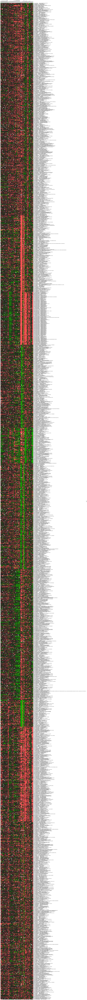

In [84]:
nc = 10

X = e98_data

cl = KMeans(n_clusters = nc, init = 'k-means++')
cl.fit(X)
e98['km'] = cl.fit_predict(X)

e98_plot = e98.set_index('NAME').sort_values('km')[e98_datacols]

cpi = 6
xs = len(e98_datacols)/cpi
ys = len(e98_plot)/cpi

fig, ax = plt.subplots(1,1,figsize=(xs,ys))
cmap = sns.diverging_palette(12.2, 127, s=99.9, l=60.0,n=10, center="dark", as_cmap=True)

sns.set(font_scale=0.8)

hm = sns.heatmap(e98_plot, cmap=cmap, vmin = -1.0, vmax = 1.0, center=0,xticklabels = True, 
                 yticklabels = True, cbar = False)

# x axis on top

ax.xaxis.tick_top() 
ax.xaxis.set_label_position('top')
xticklabels = ax.get_xticklabels()
h = ax.set_xticklabels(xticklabels, rotation = 90)

# y axis on right

ax.yaxis.tick_right()
ax.yaxis.set_label_position('right')
yticklabels = ax.get_yticklabels()
h = ax.set_yticklabels(yticklabels, rotation = 0)

plt.rcParams.update(inline_rc)

In [97]:
e98.to_csv("data/go/e98_clustered.csv")

In [ ]:
e98 = pd.read_csv("data/go/e98_clustered.csv")

/anaconda3/lib/python3.6/site-packages/matplotlib/__init__.py:855: MatplotlibDeprecationWarning: 
examples.directory is deprecated; in the future, examples will be found relative to the 'datapath' directory.
  "found relative to the 'datapath' directory.".format(key))
/anaconda3/lib/python3.6/site-packages/matplotlib/__init__.py:846: MatplotlibDeprecationWarning: 
The text.latex.unicode rcparam was deprecated in Matplotlib 2.2 and will be removed in 3.1.
  "2.2", name=key, obj_type="rcparam", addendum=addendum)


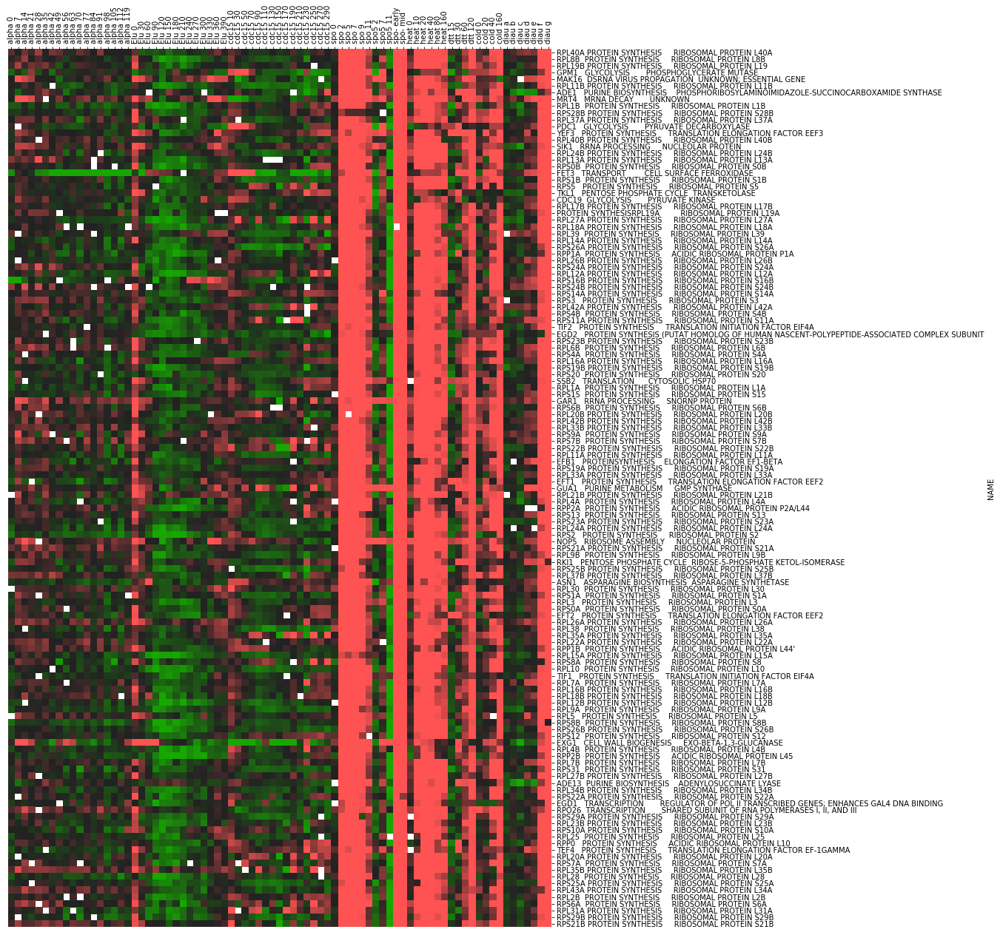

In [85]:
#
# plot groups
#

e98_plot = e98[e98['km'] == 2].set_index('NAME')[e98_datacols]

cpi = 6
xs = len(e98_datacols)/cpi
ys = len(e98_plot)/cpi

fig, ax = plt.subplots(1,1,figsize=(xs,ys))
cmap = sns.diverging_palette(12.2, 127, s=99.9, l=60.0,n=10, center="dark", as_cmap=True)

sns.set(font_scale=0.8)

hm = sns.heatmap(e98_plot, cmap=cmap, vmin = -1.0, vmax = 1.0, center=0,xticklabels = True, 
                 yticklabels = True, cbar = False)

# x axis on top

ax.xaxis.tick_top() 
ax.xaxis.set_label_position('top')
xticklabels = ax.get_xticklabels()
h = ax.set_xticklabels(xticklabels, rotation = 90)

# y axis on right

ax.yaxis.tick_right()
ax.yaxis.set_label_position('right')
yticklabels = ax.get_yticklabels()
h = ax.set_yticklabels(yticklabels, rotation = 0)

plt.rcParams.update(inline_rc)



In [12]:
go = pd.read_csv("data/go/go_slim_mapping.tab", sep="\t",names=['orf','gene','sgdid','aspect','GO','goid','type'])

In [14]:
go.head(10)

,orf,gene,sgdid,aspect,GO,goid,type
0,HRA1,HRA1,S000119380,C,cellular_component,GO:0005575,ncRNA_gene
1,HRA1,HRA1,S000119380,F,molecular_function,GO:0003674,ncRNA_gene
2,HRA1,HRA1,S000119380,P,rRNA processing,GO:0006364,ncRNA_gene
3,HRA1,HRA1,S000119380,P,ribosomal small subunit biogenesis,GO:0042274,ncRNA_gene
4,ICR1,ICR1,S000132612,C,nucleus,GO:0005634,ncRNA_gene
5,ICR1,ICR1,S000132612,F,molecular_function,GO:0003674,ncRNA_gene
6,ICR1,ICR1,S000132612,P,transcription from RNA polymerase II promoter,GO:0006366,ncRNA_gene
7,LSR1,LSR1,S000006478,C,nucleus,GO:0005634,snRNA_gene
8,LSR1,LSR1,S000006478,F,RNA binding,GO:0003723,snRNA_gene
9,LSR1,LSR1,S000006478,P,RNA splicing,GO:0008380,snRNA_gene


In [19]:
go_orfs=go['orf'].unique()

In [23]:
e98_orfs=e98['ORF']

In [24]:
for orf in e98_orfs:
    if orf not in go_orfs:
        print (orf)

YIL171W
YER109C
YER108C
YBR090C-A
YAR044W
YIL168W
YIL167W
YOR031W
YJR028W
YKL200C
YIL170W


In [86]:
# lets make a new dataframe for doing predictions

e98_P = e98[['ORF','km']]

In [87]:
# we need a dummy column for each GO category 

gocs = []
for goc in go[(go.aspect == "P")]['GO'].unique():
    gocs.append('goc_%s' % goc)
    e98_P['goc_%s' % goc] = 0

In [88]:
# sets the appropriate cells - gene x GO category - to 1

for i,r in e98_P.iterrows():
    p = go[go.orf == r.ORF]
    for pi,pr in p.iterrows():
        e98_P.loc[i,'goc_%s' % pr.GO] = 1
        

In [89]:
X = e98_P[gocs].values
y = e98_P['km'].values

In [90]:

dc = DecisionTreeClassifier()
dc.fit(X,y)
print(dc)

y_pred = dc.predict(X)

# summarize the fit of the model
print(metrics.classification_report(y, y_pred))
print(metrics.confusion_matrix(y, y_pred))

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')
              precision    recall  f1-score   support

           0       0.54      0.82      0.65       526
           1       0.65      0.55      0.59       189
           2       0.86      0.87      0.86       131
           3       0.76      0.50      0.60       206
           4       0.71      0.53      0.61        87
           5       0.86      0.60      0.71       263
           6       0.71      0.62      0.66       324
           7       0.85      0.67      0.75        66
           8       0.70      0.67      0.69       234
           9       0.62      0.61      0.61       441

   micro avg       0.66      0.66      0.66      2467


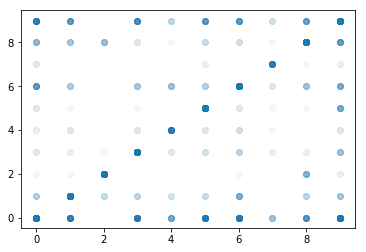

In [91]:
plt.scatter(y,y_pred,alpha=.05)

In [92]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=41367)

In [93]:
dc = DecisionTreeClassifier()
dc.fit(X_train,y_train)
print(dc)

y_pred = dc.predict(X_test)

# summarize the fit of the model
print(metrics.classification_report(y_test, y_pred))
print(metrics.confusion_matrix(y_test, y_pred))

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')
              precision    recall  f1-score   support

           0       0.27      0.47      0.34       252
           1       0.25      0.23      0.24        98
           2       0.74      0.77      0.75        65
           3       0.15      0.08      0.10       113
           4       0.23      0.14      0.18        42
           5       0.25      0.18      0.21       131
           6       0.33      0.25      0.28       155
           7       0.32      0.18      0.23        34
           8       0.46      0.36      0.40       118
           9       0.30      0.30      0.30       226

   micro avg       0.31      0.31      0.31      1234


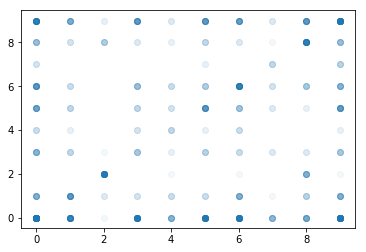

In [94]:
plt.scatter(y_test,y_pred,alpha=.05)

In [95]:
k = 2

X = e98_k25_P[gocs].values
y = np.where(e98_k25_P['km'].values == k,1,0)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=41367)

dc = DecisionTreeClassifier()
dc.fit(X_train,y_train)
print(dc)

y_pred = dc.predict(X_test)

# summarize the fit of the model
print(metrics.classification_report(y_test, y_pred))
print(metrics.confusion_matrix(y_test, y_pred))

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       589
           1       0.89      0.89      0.89        28

   micro avg       0.99      0.99      0.99       617
   macro avg       0.94      0.94      0.94       617
weighted avg       0.99      0.99      0.99       617

[[586   3]
 [  3  25]]


In [96]:
for k in range(0,25):
    
    print ("\n\n ==== Cluster %d ====" % k)

    X = e98_k25_P[gocs].values
    y = np.where(e98_k25_P['km'].values == k,1,0)

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.5, random_state=41367)

    dc = DecisionTreeClassifier()
    dc.fit(X_train,y_train)
    #print(dc)

    y_pred = dc.predict(X_test)

    # summarize the fit of the model
    #print(metrics.classification_report(y_test, y_pred))
    print(metrics.confusion_matrix(y_test, y_pred))



 ==== Cluster 0 ====
[[1224    6]
 [   3    1]]


 ==== Cluster 1 ====
[[1118   37]
 [  75    4]]


 ==== Cluster 2 ====
[[1173   12]
 [   8   41]]


 ==== Cluster 3 ====
[[1190   19]
 [  21    4]]


 ==== Cluster 4 ====
[[1220    5]
 [   8    1]]


 ==== Cluster 5 ====
[[1143   34]
 [  55    2]]


 ==== Cluster 6 ====
[[1145   37]
 [  47    5]]


 ==== Cluster 7 ====
[[1082   60]
 [  80   12]]


 ==== Cluster 8 ====
[[1189   19]
 [  18    8]]


 ==== Cluster 9 ====
[[1142   33]
 [  41   18]]


 ==== Cluster 10 ====
[[1083   45]
 [ 105    1]]


 ==== Cluster 11 ====
[[1216    5]
 [  12    1]]


 ==== Cluster 12 ====
[[1156   17]
 [  59    2]]


 ==== Cluster 13 ====
[[1186   13]
 [  23   12]]


 ==== Cluster 14 ====
[[1223    2]
 [   6    3]]


 ==== Cluster 15 ====
[[1148   23]
 [  58    5]]


 ==== Cluster 16 ====
[[1096   42]
 [  77   19]]


 ==== Cluster 17 ====
[[1181   22]
 [  21   10]]


 ==== Cluster 18 ====
[[1080   61]
 [  84    9]]


 ==== Cluster 19 ====
[[1137   41]
 [  